In [1]:
import pandas as pd
import numpy as np
import ast
pd.plotting.register_matplotlib_converters()
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import time
import os
import selenium
from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.common.action_chains import ActionChains
from PIL import Image
from selenium.common.exceptions import NoSuchElementException
import io
import requests
from selenium.common.exceptions import ElementClickInterceptedException
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [ ]:
chrome_driver = '/Users/marissakhoury/Desktop/webscrape/drivers/chromedriver'

In [ ]:
# load in the data from data clean notebook
full_data = pd.read_csv('full_data.csv')
one_hot_encoded_data = pd.read_csv('data_vis_01.csv')

In [ ]:
one_hot_encoded_data.Label.isna().sum()

In [ ]:
# use one_hot_encoded_data to get the label and put it in the label column
def get_label(url):
    driver = webdriver.Chrome(executable_path = chrome_path)
    url = 'https://www.sephora.com/product/avocado-melt-retinol-eye-sleeping-mask-P447791?icid2=products%20grid:p447791'
    driver.get(url)
    time.sleep(2)
    
    # parse label
    label = driver.find_element_by_xpath('/html/body/div[1]/div[2]/div/main/div/div[1]/nav/ol/li[3]/a').text
    driver.close()
    return label
    
get_label('https://www.sephora.com/product/avocado-melt-retinol-eye-sleeping-mask-P447791?icid2=products%20grid:p447791')

In [ ]:
# use one_hot_encoded_data to navigate to each url then extract the label and correct the df with the correct label
def get_labels(df, enum=None):
    if enum is None:
        enum = df.index[751:]
    for i, ind in enumerate(enum):
        url = df.URL[ind]
        driver = webdriver.Chrome(executable_path = chrome_path)
        driver.get(url)
        time.sleep(2)
         # parse label
        try:
            label = driver.find_element_by_xpath('/html/body/div[1]/div[2]/div/main/div/div[1]/nav/ol/li[3]/a').text
            one_hot_encoded_data.at[ind, 'Label'] = label
        except NoSuchElementException:
            one_hot_encoded_data.at[ind, 'Label'] = None
            continue

        driver.quit()
    return df
df_with_labels = get_labels(one_hot_encoded_data, one_hot_encoded_data.index[one_hot_encoded_data.Label.isna()])
df_with_labels.to_csv('data_vis_02.csv')

In [24]:
one_hot_encoded_data[one_hot_encoded_data.Label == 'vegan-skin-care']

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Label,URL,brand,description,full_description,name,num_reviews,...,tetrahydrofurfuryl methacrylate,trendsetting,trimethylolpropane trimethacrylate,vegan,women’s wear,yeast Extract\Faex\Extrait De Levure,yellow 5 (Ci 19140),Red 28 Lake (CI 45410),Red 7 Lake (CI 15850),Yellow 5 Lake (CI 19140)
776,776,776,776,vegan-skin-care,https://www.sephora.com/product/the-ordinary-d...,The Ordinary,A bestselling face moisturizer that’s free of ...,NaN,Caffeine Solution 5% + EGCG,1385.0,...,0,0,0,0,0,0,0,0,0,0
777,777,777,777,vegan-skin-care,https://www.sephora.com/product/laneige-lip-da...,LANEIGE,A duo that includes is a Lip Glowy Balm to use...,NaN,Lip Daydreams Set,11.0,...,0,0,0,0,0,0,0,0,0,0
778,778,778,778,vegan-skin-care,https://www.sephora.com/product/ultra-repair-c...,First Aid Beauty,"A fast-absorbing, rich moisturizer that provid...",NaN,Ultra Repair® Cream Intense Hydration,6912.0,...,0,0,0,0,0,0,0,0,0,0
779,779,779,779,vegan-skin-care,https://www.sephora.com/product/youth-to-the-p...,Youth To The People,An overnight eye cream formulated to visibly s...,NaN,Dream Eye Cream with Goji Stem Cell and Ceramides,172.0,...,1,0,1,0,0,0,0,0,0,0
780,780,780,780,vegan-skin-care,https://www.sephora.com/product/the-ordinary-d...,The Ordinary,A bestselling face moisturizer that’s free of ...,NaN,Azelaic Acid Suspension 10%,585.0,...,0,0,0,0,0,0,0,0,0,0
781,781,781,781,vegan-skin-care,https://www.sephora.com/product/drunk-elephant...,Drunk Elephant,A limited-edition evening skincare set to wash...,NaN,Glowy the Night Kit,10.0,...,1,0,1,0,0,0,0,0,0,0
782,782,782,782,vegan-skin-care,https://www.sephora.com/product/sephora-collec...,SEPHORA COLLECTION,A tropical skincare set that will warm your wi...,NaN,Tropical Set,14.0,...,1,0,1,0,0,0,0,0,0,0
783,783,783,783,vegan-skin-care,https://www.sephora.com/product/farmacy-honey-...,Farmacy,"An intense moisturizer that replenishes dry, d...",NaN,Honey Halo Ultra-Hydrating Ceramide Moisturizer,307.0,...,1,0,1,0,0,0,0,0,0,0
784,784,784,784,vegan-skin-care,https://www.sephora.com/product/adaptogen-deep...,Youth To The People,A hydrating moisturizer with superior plant ex...,NaN,Adaptogen Deep Moisture Cream with Ashwagandha...,1596.0,...,1,0,1,0,0,0,0,0,0,0
785,785,785,785,vegan-skin-care,https://www.sephora.com/product/the-ordinary-d...,The Ordinary,A bestselling face moisturizer that’s free of ...,NaN,Alpha Arbutin 2% + HA,408.0,...,0,0,0,0,0,0,0,0,0,0


In [6]:
one_hot_encoded_data.to_csv('data_vis_01.csv')

### Dealing with products with no labels

These are the products that are mini size or gift sets, so let's omit them from the data anyways.

In [50]:
# investigating the URLs of the products that have labels = None
# there are 86 products that have label = None; after investigating further, I noticed these correspond to the products that are mini size or gift sets
data = one_hot_encoded_data[one_hot_encoded_data.Label.notna()]
data = data.drop(columns = '1')

In [52]:
data_without_labels = one_hot_encoded_data[one_hot_encoded_data.Label.isna()]
data_without_labels.to_csv('data_without_labels')

In [14]:
# mayvke a set of all the unique ingredients
# empty list of lists to store ingredient list for each product in a list 
lists_of_ingred = []
for i in full_data.ingredients:
    try:
        clean = ast.literal_eval(i)
        lists_of_ingred.append(clean)
    except:
        # is nan
        continue
# create an empty set to add in each unique ingredient into the set
set_ingredients = set()

for element in lists_of_ingred:
    for ingredient in element:
        if ingredient:
            set_ingredients.add(ingredient)


In [15]:
set_ingredients

{'Theanine',
 'Bismuth Oxychloride (CI 77163)',
 'Blend of Shiny Polymers',
 'Copper Tripeptide-1.',
 'Hydrolyzed Sodium Hyaluronate',
 'Squalene.',
 'Vanilla Planifolia (Vanilla Bean) Fruit Extract**',
 'Your Skin But Better Makeup Primer+:',
 'Caesalpinia Spinosa Gum',
 'Leontopodium Alpinum Callus Culture Extract',
 'Acetyl Dipeptide-1 Cetyl Ester',
 'Phytosterols Complex',
 'Lipopeptides',
 'Polyethylene Terephthalate',
 'Lauryl Betaine',
 'Rosemary Oil',
 'Honey/Mel/Miel',
 'Pantethine',
 'Vegetable Oil',
 'Acrylates/Stearyl Methacrylate Copolymer',
 'Sclerocarya Birrea Seed Oil',
 'Niacinamide 3%',
 'Vp/Hexadecene Copolymer',
 'Arginine Hcl',
 'Peptides',
 'Curcuma Longa (Turmeric) Root Powder',
 'Mannitol',
 'Avobenzone 2.5%, Octinoxate 7.49%, Octocrylene 2%, and Oxybenzone 1%',
 'Dibutyl Ethylhexanoyl Glutamide',
 'Bisabolol',
 'Carrageenan/Chondrus Crispus',
 'Saccharomyces Cerevisiae (Yeast) Extract',
 'PEG-32',
 'Hydroxyyacetophenone',
 'Bis- Diglyceryl Polyacyladipate-2',
 

In [ ]:
# one hot encoded ingredients begins at column 13 (Bergamot Fruit Oil) and ends at column 5246 (Yellow 5 Lake)
pd.set_option('display.max_columns', 20)
most_popular_ingredients = one_hot_encoded_data.iloc[:,13:5246].sum().nlargest(50)
most_popular_ingredients = most_popular_ingredients.drop('1')

## WordCloud of Most Popular Ingredients found in Sephora's Products

(-0.5, 999.5, 999.5, -0.5)

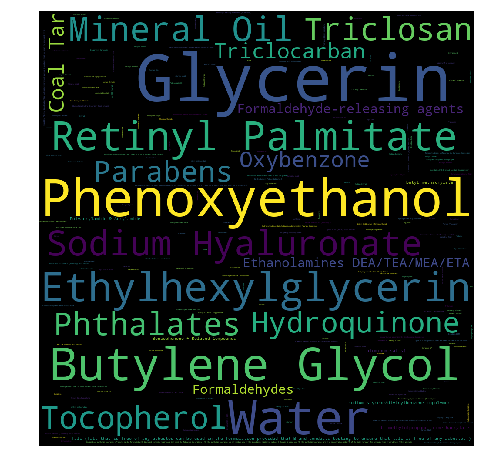

In [17]:
# making a WordCloud map of ingredients
lists_of_ingred
ingred = []
for element in lists_of_ingred:
    for ingredient in element:
        ingred.append(ingredient)

# convert it to dictionary with values and its occurences
from collections import Counter
word_cloud_dict=Counter(ingred)

# delete '1' from dict as it is not a real ingredient 
del word_cloud_dict['1'] 

wordcloud = WordCloud(width = 1000, height = 1000).generate_from_frequencies(word_cloud_dict)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
#plt.show()

## Bar Plot of the Most Common Ingredients

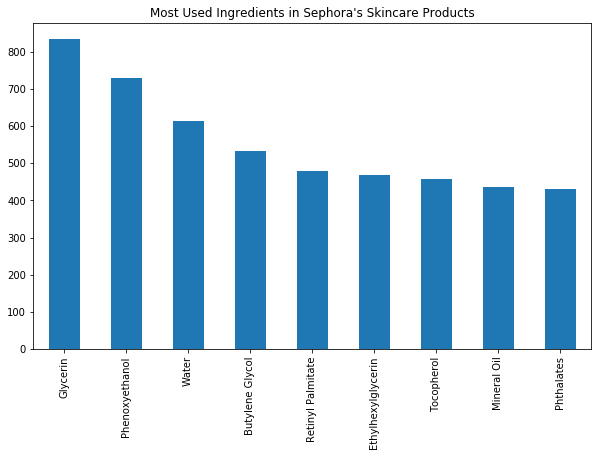

In [7]:
# making a bar plot of the most used ingredients in sephora's products
plt.figure(figsize=(10,6))
plt.title("Most Used Ingredients in Sephora's Skincare Products")
most_popular_ingredients[0:9].plot.bar()

## Distribution of Ratings for Sephora's Products

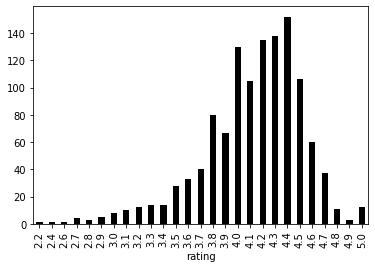

In [8]:
# distribution of ratings
rating_stats = one_hot_encoded_data.groupby('rating')['name'].count()
rating_stats.plot.bar(color = 'black')

The ratings are unevenly distributed. Sephora customers mostly write reviews when they are happy with the product.

In [48]:
data.shape

(961, 5255)

In [12]:
# practicing with grouping

# product prices from least expensive to most expensive
full_data.groupby('price').name.min()

# rating of products
ordered_rating = full_data.groupby('rating').name.min()

In [7]:
# function to find out what product sizes are not floats and therefore need further correction
def f(x):
    try:
        return float(x)
    except:
        import re
        
        match = re.search(r'^([0-9\.]+)', x)
        if match:
            return float(match.group(1))
        return None

data.prod_size = data.prod_size.map(f)

In [45]:
data.Sensitive.sum()

5

In [14]:
# csv to work off of to clean the messed up product sizes
#one_hot_encoded_data[output.isna()].to_csv('ONE_HOT_ENCODED_TODO_CLEAN_PROD_SIZE.csv')

In [9]:
data.prod_size

0      1.70
1      1.70
2      1.69
3      1.00
4      1.70
       ... 
956     NaN
957    8.00
958    3.40
959    2.40
960    8.00
Name: prod_size, Length: 961, dtype: float64

In [15]:
# data minus the troubled prod_sizes
data = one_hot_encoded_data[output.notna()]

In [10]:
data['prod_size'] = data['prod_size'].astype(float)
data.dtypes.prod_size

dtype('float64')

In [11]:
# normalize prod_size/price
data['normalized_price'] = data.prod_size / data.price

## EDA on Full Data Set

In [12]:
data.sort_values('price')
data.describe()

,Unnamed: 0,num_reviews,price,prod_size,rating,Unnamed: 12,(Bergamot) Fruit Oil,(Evening Primrose) Oil,(Guar) Gum,(SD Alcohol 40-B),...,Red 7 Lake (CI 15850),Yellow 5 Lake (CI 19140),Combination,Dry,Formulation,Normal,Oily,Sensitive,Serum,normalized_price
count,961.000000,961.000000,961.000000,681.000000,961.000000,961.000000,961.000000,961.0,961.000000,961.000000,...,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,681.000000
mean,480.000000,843.540062,48.029844,1.981373,4.136108,0.003122,0.002081,0.0,0.001041,0.002081,...,0.001041,0.001041,0.879292,0.874089,0.001041,0.899063,0.465140,0.005203,0.001041,0.062929
std,277.561104,1358.214566,42.565976,2.659560,0.402333,0.055814,0.045596,0.0,0.032258,0.045596,...,0.032258,0.032258,0.325957,0.331921,0.032258,0.301402,0.499043,0.071981,0.032258,0.097530
min,0.000000,1.000000,3.000000,0.025000,2.200000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001000
25%,240.000000,76.000000,25.000000,0.500000,3.900000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.010638
50%,480.000000,325.000000,38.000000,1.000000,4.200000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.028000
75%,720.000000,1132.000000,60.000000,2.030000,4.400000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.076923
max,960.000000,12488.000000,450.000000,30.000000,5.000000,1.000000,1.000000,0.0,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.052632


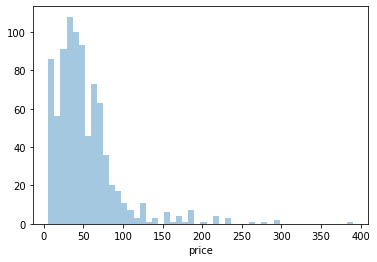

In [88]:
# histogram
sns.distplot(a=data['price'], kde=False)

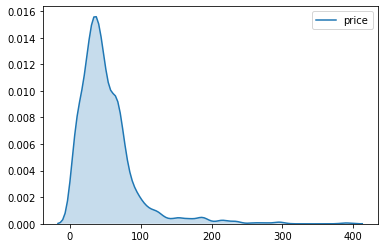

In [89]:
# density plot
sns.kdeplot(data=data['price'], shade=True)

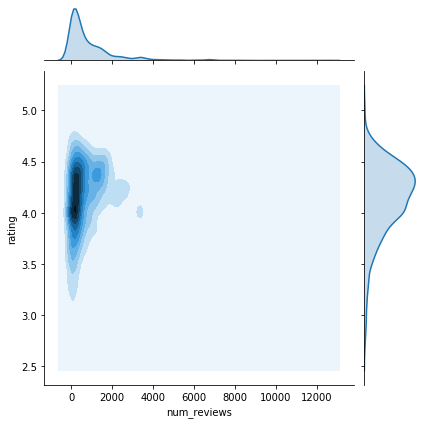

In [91]:
# 2D KDE plot
sns.jointplot(x=data['num_reviews'], y=data['rating'], kind="kde")

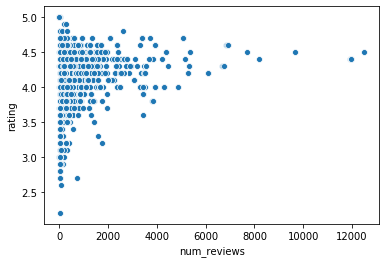

In [341]:
# scatterplot
sns.scatterplot(x=data['num_reviews'], y=data['rating'])

In [100]:
for name in data.sort_values('price', ascending=False).name:
    print(name)

The Concentrate
Crème Ancienne®
Elixir Vitae Eye Serum
The Lifting Eye Serum
TIME RESPONSE Eye Reserve Crème
The Eye Balm Intense
The Eye Concentrate
Face Cream Rich
Orchidee Imperiale Anti-Aging Eye & Lip Contour Cream
Peptide Eye Cream
Boosted Contouring Retinol Eye Balm
Orchidee Imperiale Anti-Aging Eye & Lip Contour Cream
Youth Revolution Radiance Crème & Masque
Crème de la Mer Moisturizer
The Moisturizing Cool Gel Cream
The Moisturizing Soft Cream
Facial Treatment Essence (Pitera Essence)
Facial Treatment Essence (Pitera Essence)
Facial Treatment Essence (Pitera Essence)
The Intensive Revitalizing Mask
Concentrated Ginseng Renewing Eye Cream
Neuropeptide Firming & Illuminating Under-Eye Cream
Neuropeptide Firming & Illuminating Under-Eye Cream
Crème Ancienne Supreme Eye Serum
Crème Ancienne Supreme Eye Serum
The Treatment Lotion
Future Solution LX Eye and Lip Contour Regenerating Cream
Future Solution LX Eye and Lip Contour Regenerating Cream
Future Solution LX Eye and Lip Contour

In [49]:
# what ingredients are found in the some of the most expensive products?
print(data.loc[data.name=='The Concentrate'].ingredients)
print(data.loc[data.name=='Elixir Vitae Eye Serum'].ingredients)
print(data.loc[data.name=='The Lifting Eye Serum'].ingredients)

195    ['Miracle Broth™', 'Lime Tea Concentrate', 'Cy...
Name: ingredients, dtype: object
496    ['Quadruple Neuropeptide Technology', 'Calcifi...
Name: ingredients, dtype: object
420    ['Declustered Water (-)\\Aqua\\Eau De-Structur...
Name: ingredients, dtype: object


F-Balm™ Electrolyte Waterfacial Mask Mini
D-Bronzi Anti-Pollution Bronzing Drops
D-Bronzi Anti-Pollution Bronzing Drops
E-Rase™ Milki Micellar Water
T.L.C. Sukari Babyfacial™ AHA + BHA Mask Mini
Virgin Marula Luxury  Face Oil
T.L.C. Framboos™ Glycolic Resurfacing Night Serum
Virgin Marula Luxury  Face Oil
T.L.C. Sukari Babyfacial™ AHA + BHA Mask
T.L.C. Sukari Babyfacial™ AHA + BHA Mask
T.L.C. Sukari Babyfacial™ AHA + BHA Mask
T.L.C. Framboos™ Glycolic Resurfacing Night Serum
B-Hydra™ Intensive Hydration Serum
F-Balm™ Electrolyte Waterfacial Mask
Virgin Marula Luxury  Face Oil Mini
F-Balm™ Electrolyte Waterfacial Mask
Virgin Marula Luxury  Face Oil Mini
B-Hydra™ Intensive Hydration Serum
A-Passioni™ Retinol Cream
A-Passioni™ Retinol Cream
Lala Retro™ Whipped Moisturizer with Ceramides
Beste™ No. 9 Jelly Cleanser
Protini™ Polypeptide Moisturizer
Beste™ No. 9 Jelly Cleanser
Protini™ Polypeptide Moisturizer
Shaba Complex™ Firming Eye Serum
Shaba Complex™ Firming Eye Serum
C-Tango™ Vitamin 

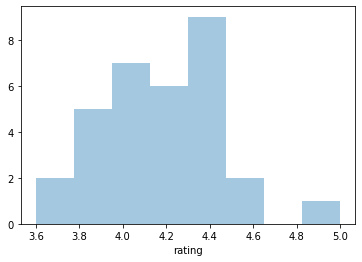

In [58]:
# let's look at drunk elephant products 
drunk_elephant = data.loc[data['brand'] == 'Drunk Elephant']
drunk_elephant.head()
drunk_elephant.describe()
for name in dr unk_elephant.sort_values('rating', ascending = False).name:
    print(name)
sns.distplot(a=drunk_elephant['rating'], kde = False)

### EDA on Combination Skin Type Product Data

In [11]:
print(data.Combination.sum())
combination = data[data.Combination == 1]
combination.head()

845


,Unnamed: 0,Label,URL,brand,description,full_description,name,num_reviews,price,prod_size,...,Yellow 5 Lake (CI 19140),ingredients,Combination,Dry,Formulation,Normal,Oily,Sensitive,Serum,normalized_price
0,0,moisturizing-cream-oils-mists,https://www.sephora.com/product/ultra-facial-c...,Kiehl's Since 1851,A bestselling face moisturizer that’s free of ...,NaN,Ultra Facial Cream,1132.0,32.0,1.70,...,0,"['Glacial Glycoprotein', 'Squalene', 'Aqua/Wat...",1,1,0,1,0,0,0,0.053125
1,1,moisturizing-cream-oils-mists,https://www.sephora.com/product/cicapair-tiger...,Dr. Jart+,A green-to-beige color-correcting treatment th...,NaN,Cicapair™ Tiger Grass Color Correcting Treatme...,3065.0,52.0,1.70,...,0,"['Centella Asiatica Complex', 'Herbs Complex',...",1,1,0,1,1,0,0,0.032692
2,2,moisturizing-cream-oils-mists,https://www.sephora.com/product/protini-tm-pol...,Drunk Elephant,A protein moisturizer that combines signal pep...,NaN,Protini™ Polypeptide Moisturizer,4872.0,68.0,1.69,...,0,"['Signal Peptide Complex (Growth Factors)', 'P...",1,1,0,1,1,0,0,0.024853
6,6,moisturizing-cream-oils-mists,https://www.sephora.com/product/facial-treatme...,SK-II,A powerful treatment to visibly soften texture...,NaN,Facial Treatment Essence (Pitera Essence),1025.0,185.0,5.40,...,0,"['PITERA™', 'Galactomyces Ferment Filtrate', '...",1,1,0,1,1,0,0,0.029189
7,7,moisturizing-cream-oils-mists,https://www.sephora.com/product/superberry-hyd...,Youth To The People,"An overnight mask that thoroughly hydrates, pl...",NaN,Superberry Hydrate + Glow Dream Mask with Vita...,1338.0,48.0,2.00,...,0,"['Vitamin C (THD Ascorbate)', 'Proprietary Sup...",1,1,0,1,1,0,0,0.041667


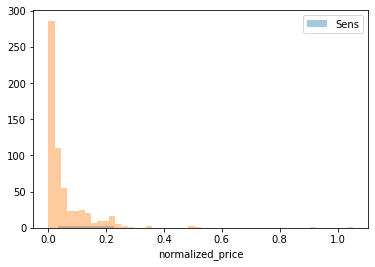

In [18]:
# histograms for multiple skin types
plt.figure('Price Comparison between Skin Types')
sns.distplot(a=sensitive['normalized_price'], label = 'Sens', kde = False)
sns.distplot(a=normal['normalized_price'], kde = False)
plt.legend()
plt.show()

In [54]:
# referred to this site: https://odacite.com/blogs/tohealthandbeauty/the-dirty-dozen-top-12-ingredients-to-avoid-in-your-skincare
sulfate_ing = set()
for col in one_hot_encoded_data.columns:
    if 'sulfate' in col.lower():
        sulfate_ing.add(col)
    elif 'aluminum' in col.lower():
        sulfate_ing.add(col)
    elif 'diethanolamine' in col.lower():
        sulfate_ing.add(col)
    elif 'monoethanolamine' in col.lower():
        sulfate_ing.add(col)
    elif 'triethanolamine' in col.lower():
        sulfate_ing.add(col)
    elif 'imidazlidinyl' in col.lower():
        sulfate_ing.add(col)
    elif 'mineral oil' in col.lower():
        sulfate_ing.add(col)
    elif 'methyl' in col.lower():
        sulfate_ing.add(col)
    elif 'butyl' in col.lower():
        sulfate_ing.add(col)
    elif 'ethyl' in col.lower():
        sulfate_ing.add(col)
    elif 'propyl' in col.lower():
        sulfate_ing.add(col)
    elif 'polyethylene glycol' in col.lower():
        sulfate_ing.add(col)
    elif 'phthalates' in col.lower():
        sulfate_ing.add(col)
    elif 'siloxanes' in col.lower():
        sulfate_ing.add(col)
    elif 'fragrance' in col.lower():
        sulfate_ing.add(col)
    elif 'triclosan' in col.lower():
        sulfate_ing.add(col)
        
        
print(str(len(sulfate_ing)) + ' bad ingredients')

367 bad ingredients


In [56]:
one_hot_encoded_data.Sensitive.sum()

123

In [55]:
# all ingredients with sulfates
bool_arr = None
for bad_ingredient in sulfate_ing:
    if bool_arr is None:
        bool_arr = one_hot_encoded_data[bad_ingredient] == 1
    else:
        bool_arr = np.logical_or(bool_arr, one_hot_encoded_data[bad_ingredient] == 1)

one_hot_encoded_data[bool_arr].Sensitive.sum()
    

115

In [57]:
# a surprising number of products with bad ingredients..
115/123

0.9349593495934959

In [38]:
# there are 3 products that are misclassified for sensitive skin (2 are repeats here)
bad_products = data[bool_arr]
bad_products[bad_products.Sensitive == 1]

,Unnamed: 0,Label,URL,brand,description,full_description,name,num_reviews,price,prod_size,...,Yellow 5 Lake (CI 19140),ingredients,Combination,Dry,Formulation,Normal,Oily,Sensitive,Serum,normalized_price
17,17,moisturizing-cream-oils-mists,https://www.sephora.com/product/adaptogen-deep...,Youth To The People,A hydrating moisturizer with superior plant ex...,NaN,Adaptogen Deep Moisture Cream with Ashwagandha...,1594.0,58.0,2.0,...,0,"['Squalane', 'Ashwagandha', 'Fermented Reishi'...",0,1,0,1,0,1,0,0.034483
69,69,moisturizing-cream-oils-mists,https://www.sephora.com/product/dr-andrew-weil...,Origins,"A mushroom-infused, hydrating, watery lotion t...",NaN,Dr. Andrew Weil For Origins™ Mega-Mushroom Rel...,1014.0,36.0,6.7,...,0,"['Reishi', 'Fermented Chaga', 'Coprinus', 'Wat...",0,0,0,0,0,1,0,0.186111
130,130,cleanser,https://www.sephora.com/product/ultra-facial-c...,Kiehl's Since 1851,A foaming cleanser formulated to help remove e...,NaN,Ultra Facial Cleanser,748.0,22.0,5.0,...,0,"['Water', 'Sodium Laureth Sulfate', 'Decyl Glu...",0,1,0,1,0,1,0,0.227273
783,783,vegan-skin-care,https://www.sephora.com/product/adaptogen-deep...,Youth To The People,A hydrating moisturizer with superior plant ex...,NaN,Adaptogen Deep Moisture Cream with Ashwagandha...,1596.0,58.0,2.0,...,0,"['Squalane', 'Ashwagandha', 'Fermented Reishi'...",0,1,0,1,0,1,0,0.034483
926,926,vegan-skin-care,https://www.sephora.com/product/dr-andrew-weil...,Origins,"A mushroom-infused, hydrating, watery lotion t...",NaN,Dr. Andrew Weil For Origins™ Mega-Mushroom Rel...,1014.0,36.0,6.7,...,0,"['Reishi', 'Fermented Chaga', 'Coprinus', 'Wat...",0,0,0,0,0,1,0,0.186111


In [41]:
good_products = data[np.logical_not(bool_arr)]
good_products[good_products.Sensitive == 1]

,Unnamed: 0,Label,URL,brand,description,full_description,name,num_reviews,price,prod_size,...,Yellow 5 Lake (CI 19140),ingredients,Combination,Dry,Formulation,Normal,Oily,Sensitive,Serum,normalized_price


In [43]:
data.Combination.sum()

845

In [24]:
np.logical_or((data['Barium Sulfate'] == 1),  data['Calcium Sulfate'] == 1).sum()


6

In [17]:
oily.normalized_price

1      0.032692
2      0.024853
6      0.029189
7      0.041667
11     0.013889
         ...   
953    0.285714
954    0.106250
956         NaN
958    0.051515
959    0.109091
Name: normalized_price, Length: 447, dtype: float64

In [74]:
 sensitive.columns

Index(['Unnamed: 0', 'Label', 'URL', 'brand', 'description',
       'full_description', 'name', 'num_reviews', 'price', 'prod_size',
       ...
       'Red 7 Lake (CI 15850)', 'Yellow 5 Lake (CI 19140)', 'ingredients',
       'Combination', 'Dry', 'Formulation', 'Normal', 'Oily', 'Sensitive',
       'Serum'],
      dtype='object', length=5255)

In [9]:
combination.iloc[:, 13:5246]

,(Bergamot) Fruit Oil,(Evening Primrose) Oil,(Guar) Gum,(SD Alcohol 40-B),+/- :Ci 12085 (Red 36,+/- May Contain/Peut Contenir: Mica,+/- May Contain: Ci 77491,+/- Mica,+/- Titanium Dioxide (Ci 77891),+/-: Iron Oxides (Ci 77499,...,taurate copolymer,tetrahydrofurfuryl methacrylate,trendsetting,trimethylolpropane trimethacrylate,vegan,women’s wear,yeast Extract\Faex\Extrait De Levure,yellow 5 (Ci 19140),Red 28 Lake (CI 45410),Red 7 Lake (CI 15850)
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
956,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
957,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0
958,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
959,0,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0


In [38]:
popular_ingred_combination = combination.iloc[:,13:5246].sum().nlargest(50)
popular_ingred_combination = popular_ingred_combination.drop('1')
popular_ingred_combination

Glycerin                                               530
Phenoxyethanol                                         459
Water                                                  399
Ethylhexylglycerin                                     313
Butylene Glycol                                        309
Retinyl Palmitate                                      295
Mineral Oil                                            275
Phthalates                                             275
Animal Oils/Musks/Fats                                 273
Benzophenone + Related Compounds                       273
Butoxyethanol                                          273
Butylated hydroxyanisole (BHA)                         273
Carbon Black                                           273
Coal Tar                                               273
Deastyrene/acrylates/dvbcopolymer                      273
Ethanolamines DEA/TEA/MEA/ETA                          273
Formaldehyde-releasing agents                          2

### EDA on Oily Skin Type Product Data

In [12]:
print(data.Oily.sum())
oily = data[data.Oily == 1]
oily.head()

447


,Unnamed: 0,Label,URL,brand,description,full_description,name,num_reviews,price,prod_size,...,Yellow 5 Lake (CI 19140),ingredients,Combination,Dry,Formulation,Normal,Oily,Sensitive,Serum,normalized_price
1,1,moisturizing-cream-oils-mists,https://www.sephora.com/product/cicapair-tiger...,Dr. Jart+,A green-to-beige color-correcting treatment th...,NaN,Cicapair™ Tiger Grass Color Correcting Treatme...,3065.0,52.0,1.70,...,0,"['Centella Asiatica Complex', 'Herbs Complex',...",1,1,0,1,1,0,0,0.032692
2,2,moisturizing-cream-oils-mists,https://www.sephora.com/product/protini-tm-pol...,Drunk Elephant,A protein moisturizer that combines signal pep...,NaN,Protini™ Polypeptide Moisturizer,4872.0,68.0,1.69,...,0,"['Signal Peptide Complex (Growth Factors)', 'P...",1,1,0,1,1,0,0,0.024853
6,6,moisturizing-cream-oils-mists,https://www.sephora.com/product/facial-treatme...,SK-II,A powerful treatment to visibly soften texture...,NaN,Facial Treatment Essence (Pitera Essence),1025.0,185.0,5.40,...,0,"['PITERA™', 'Galactomyces Ferment Filtrate', '...",1,1,0,1,1,0,0,0.029189
7,7,moisturizing-cream-oils-mists,https://www.sephora.com/product/superberry-hyd...,Youth To The People,"An overnight mask that thoroughly hydrates, pl...",NaN,Superberry Hydrate + Glow Dream Mask with Vita...,1338.0,48.0,2.00,...,0,"['Vitamin C (THD Ascorbate)', 'Proprietary Sup...",1,1,0,1,1,0,0,0.041667
11,11,moisturizing-cream-oils-mists,https://www.sephora.com/product/virgin-marula-...,Drunk Elephant,A face oil rich in critical antioxidants and o...,NaN,Virgin Marula Luxury Face Oil,1516.0,72.0,1.00,...,0,"['Sclerocarya Birrea (Marula) Seed Oil', 'Para...",1,1,0,1,1,0,0,0.013889


In [343]:
oily.describe()

,Unnamed: 0,num_reviews,price,rating,Unnamed: 12,(Bergamot) Fruit Oil,(Evening Primrose) Oil,(Guar) Gum,(SD Alcohol 40-B),+/- :Ci 12085 (Red 36,+/- May Contain/Peut Contenir: Mica,+/- May Contain: Ci 77491,+/- Mica,+/- Titanium Dioxide (Ci 77891),+/-: Iron Oxides (Ci 77499,+/-: Titanium Dioxide (Ci 77891),+Fragrances Of Natural Origin,-Coconut Oil,1,1% Epitensive,100 Percent Natural DHA,100 Percent Natural Fragrance,100 Percent Pure Argan Oil,100 percent fragrance-free,100% Polyester,100% Pure Argan Oil,100% Squalane Oil,100% Sugarcane-Derived Squalane,100% Zinc Oxide,15% Ascorbyl Glucoside (Vitamin C),2 Hexanediol,2- Hexanediol,2-Bromo-2-Nitropropane-1,2-Dimethylhydrocinnamal,2-Hexanediol,2-Methylbutyric Acid,2-O-Ethyl Ascorbic Acid,2-hexanediol,24K Gold,3%,3% Butterfly Ginger Root Extract,3-0-Ethyl Ascorbic Acid,3-Ceramide Blend,3-Diol,3-Glyceryl Ascorbate,3-Glyceryl Ascorbate (Vitamin C),3-O-Ethyl Ascorbic Acid,3-O-Ethyl Ascorbic Acid (Vitamin C),30 Percent Hyaluronic Acid Complex,3D Hyaluronic Acid,4-t- Butylcyclohexanol,4-t-Butylcyclohexanol,5-Cera Complex,5-Cera Complex (Ceramides),6-Naphthalate,77492,77499),A C10-30 Cholesterol/Lanosterol Esters,A-Passioni™ Retinol Cream:,AA Barrier Serum:,AHA/BHA/Flower Acid Blend 14%,AHA/Glycolic Acid,ALIVE Prebiotic Balancing Mask:,AM,Abies Sibirica (Siberian Fir) Oil,Acacia Decurrens Flower Cera,Acacia Decurrens Flower Wax,Acacia Farnesiana Flower Wax,Acacia Senegal Gum,Acacia Seyal Gum Extract,Acai,Acai Berry Sterols,Acai Smoothie Mask:,Acanthopanax Senticocus (Siberian) Root Extract,Acer Saccharum (Sugar Maple) Extract,Acerola Cherry,Acerola Seed Extract,Acetamidoethoxyethanol,Acetic Acid,Acetyl Carnitine HCL,Acetyl Carnitine Hcl,Acetyl Citrull Amido Arginine,Acetyl Dipeptide-1 Cetyl Ester,Acetyl Glucosamine,Acetyl Glutamine,Acetyl Heptapeptide-4,Acetyl Hexapeptide-3,Acetyl Hexapeptide-51 (Amide),Acetyl Hexapeptide-8,Acetyl Hydroxyproline,Acetyl Octapeptide-3,Acetyl Tetrapeptide-15 (098/131),Acetyl Tetrapeptide-17,Acetyl Tetrapeptide-2,Acetyl Tetrapeptide-3,Acetyl Tetrapeptide-5,Acetyl Tetrapeptide-9,Acetyl Tyrosine,Acetyl Zingerone,Acetylarginyltryptophyl Diphenylglycine,Achillea Millefolium Extract,Achillea Millefolium Flower Extract,Acmella Oleracea,Acmella Oleracea (Spilanthes) Extract,Acmella Oleracea Extract,Acorus Calamus Root Extract,AcquaCell 3%,Acrylamide/Sodium Acryloyldimethyltaurate Copolymer,Acrylates Copolymer,Acrylates Crosspolymer,Acrylates Crosspolymer-4,Acrylates/ C10-30 Alkyl Acrylate Crosspolymer,Acrylates/Ammonium Methacrylate Copolymer,Acrylates/Beheneth-25 Methacrylate Copolymer,Acrylates/C10-30 Alkyl Acrylate Crosspolyme,Acrylates/C10-30 Alkyl Acrylate Crosspolymer,Acrylates/C10-30 Alkylacrylate Crosspolymer,Acrylates/C10-30 Alykyl Acrylate Crosspolymer,Acrylates/Carbamate Copolymer,Acrylates/Dimethicone Copolyme,Acrylates/Dimethicone Copolymer,Acrylates/Ethylhexyl Acrylate Crosspolymer,Acrylates/Ethylhexyl Acrylate/Dimethicone Methacrylate Copolymer,Acrylates/Palmeth-25 Acrylate Copolymer,Acrylates/Steareth-20 Methacrylate Copolymer,Acrylates/Stearyl Acrylate/Dimethicone Methacrylate Copolymer,Acrylates/Stearyl Methacrylate Copolymer,Acrylates/c10-30 Alkyl Acrylate Crosspolymer,Acrylates/c10-30 alkyl acrylate crosspolymer,Acrylates/dimethicone Copolymer,Acrylic Acid/Vp Crosspolymer,Acryloyldimethyltaurate/Vp Copolymer,Actinidia Chinensis (Kiwi) Fruit Extract,Actinidia Chinensis Seed Oil,Activated C,Activated charcoal,Activated-X Charcoal,Active Cartridge Concentrate for Fatigue:,Active Ingredients: Zinc Oxide 12%,Acyl-Glutathion,Acyl-Glutathione,Adansonia Digitata Fruit Extract,Adansonia Digitata Leaf Extract,Adansonia Digitata Seed Extract,Adansonia Digitata Seed Oil,Adaptogen Complex,Aden- Osine,Adenosine,Adenosine Phosphate,Adenosine Triphosphate,Adipic Acid/Neopentyl Glycol Crosspolymer,Advanced Combination of Hyaluronic Acids,Advanced Time-Release Technology,Aesculus Hippocastanum (Horse Chestnut) Extract,Aframomum Angustifolium Seed Extract,African-

In [44]:
popular_ingred_oily = oily.iloc[:,13:5246].sum().nlargest(50)
popular_ingred_oily = popular_ingred_oily.drop('1')
popular_ingred_oily

Glycerin                                               372
Phenoxyethanol                                         321
Water                                                  258
Ethylhexylglycerin                                     223
Butylene Glycol                                        221
Retinyl Palmitate                                      214
Mineral Oil                                            203
Phthalates                                             203
Animal Oils/Musks/Fats                                 201
Benzophenone + Related Compounds                       201
Butoxyethanol                                          201
Butylated hydroxyanisole (BHA)                         201
Carbon Black                                           201
Coal Tar                                               201
Deastyrene/acrylates/dvbcopolymer                      201
Ethanolamines DEA/TEA/MEA/ETA                          201
Formaldehyde-releasing agents                          2

### EDA on Sensitive Skin Type Product Data

In [53]:
print(data.Sensitive.sum())
sensitive = data[data.Sensitive == 1]
sensitive.sum()

5


Unnamed: 0                                                  1925
Label          moisturizing-cream-oils-mistsmoisturizing-crea...
URL            https://www.sephora.com/product/adaptogen-deep...
brand          Youth To The PeopleOriginsKiehl's Since 1851Yo...
description    A hydrating moisturizer with superior plant ex...
                                     ...                        
Formulation                                                    0
Normal                                                         3
Oily                                                           0
Sensitive                                                      5
Serum                                                          0
Length: 5254, dtype: object

In [344]:
sensitive.describe()

,Unnamed: 0,num_reviews,price,rating,Unnamed: 12,(Bergamot) Fruit Oil,(Evening Primrose) Oil,(Guar) Gum,(SD Alcohol 40-B),+/- :Ci 12085 (Red 36,+/- May Contain/Peut Contenir: Mica,+/- May Contain: Ci 77491,+/- Mica,+/- Titanium Dioxide (Ci 77891),+/-: Iron Oxides (Ci 77499,+/-: Titanium Dioxide (Ci 77891),+Fragrances Of Natural Origin,-Coconut Oil,1,1% Epitensive,100 Percent Natural DHA,100 Percent Natural Fragrance,100 Percent Pure Argan Oil,100 percent fragrance-free,100% Polyester,100% Pure Argan Oil,100% Squalane Oil,100% Sugarcane-Derived Squalane,100% Zinc Oxide,15% Ascorbyl Glucoside (Vitamin C),2 Hexanediol,2- Hexanediol,2-Bromo-2-Nitropropane-1,2-Dimethylhydrocinnamal,2-Hexanediol,2-Methylbutyric Acid,2-O-Ethyl Ascorbic Acid,2-hexanediol,24K Gold,3%,3% Butterfly Ginger Root Extract,3-0-Ethyl Ascorbic Acid,3-Ceramide Blend,3-Diol,3-Glyceryl Ascorbate,3-Glyceryl Ascorbate (Vitamin C),3-O-Ethyl Ascorbic Acid,3-O-Ethyl Ascorbic Acid (Vitamin C),30 Percent Hyaluronic Acid Complex,3D Hyaluronic Acid,4-t- Butylcyclohexanol,4-t-Butylcyclohexanol,5-Cera Complex,5-Cera Complex (Ceramides),6-Naphthalate,77492,77499),A C10-30 Cholesterol/Lanosterol Esters,A-Passioni™ Retinol Cream:,AA Barrier Serum:,AHA/BHA/Flower Acid Blend 14%,AHA/Glycolic Acid,ALIVE Prebiotic Balancing Mask:,AM,Abies Sibirica (Siberian Fir) Oil,Acacia Decurrens Flower Cera,Acacia Decurrens Flower Wax,Acacia Farnesiana Flower Wax,Acacia Senegal Gum,Acacia Seyal Gum Extract,Acai,Acai Berry Sterols,Acai Smoothie Mask:,Acanthopanax Senticocus (Siberian) Root Extract,Acer Saccharum (Sugar Maple) Extract,Acerola Cherry,Acerola Seed Extract,Acetamidoethoxyethanol,Acetic Acid,Acetyl Carnitine HCL,Acetyl Carnitine Hcl,Acetyl Citrull Amido Arginine,Acetyl Dipeptide-1 Cetyl Ester,Acetyl Glucosamine,Acetyl Glutamine,Acetyl Heptapeptide-4,Acetyl Hexapeptide-3,Acetyl Hexapeptide-51 (Amide),Acetyl Hexapeptide-8,Acetyl Hydroxyproline,Acetyl Octapeptide-3,Acetyl Tetrapeptide-15 (098/131),Acetyl Tetrapeptide-17,Acetyl Tetrapeptide-2,Acetyl Tetrapeptide-3,Acetyl Tetrapeptide-5,Acetyl Tetrapeptide-9,Acetyl Tyrosine,Acetyl Zingerone,Acetylarginyltryptophyl Diphenylglycine,Achillea Millefolium Extract,Achillea Millefolium Flower Extract,Acmella Oleracea,Acmella Oleracea (Spilanthes) Extract,Acmella Oleracea Extract,Acorus Calamus Root Extract,AcquaCell 3%,Acrylamide/Sodium Acryloyldimethyltaurate Copolymer,Acrylates Copolymer,Acrylates Crosspolymer,Acrylates Crosspolymer-4,Acrylates/ C10-30 Alkyl Acrylate Crosspolymer,Acrylates/Ammonium Methacrylate Copolymer,Acrylates/Beheneth-25 Methacrylate Copolymer,Acrylates/C10-30 Alkyl Acrylate Crosspolyme,Acrylates/C10-30 Alkyl Acrylate Crosspolymer,Acrylates/C10-30 Alkylacrylate Crosspolymer,Acrylates/C10-30 Alykyl Acrylate Crosspolymer,Acrylates/Carbamate Copolymer,Acrylates/Dimethicone Copolyme,Acrylates/Dimethicone Copolymer,Acrylates/Ethylhexyl Acrylate Crosspolymer,Acrylates/Ethylhexyl Acrylate/Dimethicone Methacrylate Copolymer,Acrylates/Palmeth-25 Acrylate Copolymer,Acrylates/Steareth-20 Methacrylate Copolymer,Acrylates/Stearyl Acrylate/Dimethicone Methacrylate Copolymer,Acrylates/Stearyl Methacrylate Copolymer,Acrylates/c10-30 Alkyl Acrylate Crosspolymer,Acrylates/c10-30 alkyl acrylate crosspolymer,Acrylates/dimethicone Copolymer,Acrylic Acid/Vp Crosspolymer,Acryloyldimethyltaurate/Vp Copolymer,Actinidia Chinensis (Kiwi) Fruit Extract,Actinidia Chinensis Seed Oil,Activated C,Activated charcoal,Activated-X Charcoal,Active Cartridge Concentrate for Fatigue:,Active Ingredients: Zinc Oxide 12%,Acyl-Glutathion,Acyl-Glutathione,Adansonia Digitata Fruit Extract,Adansonia Digitata Leaf Extract,Adansonia Digitata Seed Extract,Adansonia Digitata Seed Oil,Adaptogen Complex,Aden- Osine,Adenosine,Adenosine Phosphate,Adenosine Triphosphate,Adipic Acid/Neopentyl Glycol Crosspolymer,Advanced Combination of Hyaluronic Acids,Advanced Time-Release Technology,Aesculus Hippocastanum (Horse Chestnut) Extract,Aframomum Angustifolium Seed Extract,African-

In [40]:
popular_ingred_sensitive = sensitive.iloc[:,13:5246].sum().nlargest(50)
popular_ingred_sensitive = popular_ingred_sensitive.drop('1')
popular_ingred_sensitive

Glycerin                                               76
Water                                                  75
Phenoxyethanol                                         70
Ethylhexylglycerin                                     50
Butylene Glycol                                        40
Citric Acid                                            35
Dimethicone                                            33
Sodium Hyaluronate                                     33
Retinyl Palmitate                                      32
Tocopherol                                             32
Tocopheryl Acetate                                     32
Animal Oils/Musks/Fats                                 29
Benzophenone + Related Compounds                       29
Butoxyethanol                                          29
Butylated hydroxyanisole (BHA)                         29
Carbon Black                                           29
Coal Tar                                               29
Deastyrene/acr

### EDA on Normal Skin Type Product Data

In [14]:
print(data.Normal.sum())
normal = data[data.Normal == 1]
normal.head()

864


,Unnamed: 0,Label,URL,brand,description,full_description,name,num_reviews,price,prod_size,...,Yellow 5 Lake (CI 19140),ingredients,Combination,Dry,Formulation,Normal,Oily,Sensitive,Serum,normalized_price
0,0,moisturizing-cream-oils-mists,https://www.sephora.com/product/ultra-facial-c...,Kiehl's Since 1851,A bestselling face moisturizer that’s free of ...,NaN,Ultra Facial Cream,1132.0,32.0,1.70,...,0,"['Glacial Glycoprotein', 'Squalene', 'Aqua/Wat...",1,1,0,1,0,0,0,0.053125
1,1,moisturizing-cream-oils-mists,https://www.sephora.com/product/cicapair-tiger...,Dr. Jart+,A green-to-beige color-correcting treatment th...,NaN,Cicapair™ Tiger Grass Color Correcting Treatme...,3065.0,52.0,1.70,...,0,"['Centella Asiatica Complex', 'Herbs Complex',...",1,1,0,1,1,0,0,0.032692
2,2,moisturizing-cream-oils-mists,https://www.sephora.com/product/protini-tm-pol...,Drunk Elephant,A protein moisturizer that combines signal pep...,NaN,Protini™ Polypeptide Moisturizer,4872.0,68.0,1.69,...,0,"['Signal Peptide Complex (Growth Factors)', 'P...",1,1,0,1,1,0,0,0.024853
4,4,moisturizing-cream-oils-mists,https://www.sephora.com/product/the-dewy-skin-...,Tatcha,A rich cream that feeds skin with plumping hyd...,NaN,The Dewy Skin Cream Plumping & Hydrating Moist...,1727.0,68.0,1.70,...,0,"['Aqua/Water/Eau', 'Glycerin', 'Propanediol', ...",0,1,0,1,0,0,0,0.025000
6,6,moisturizing-cream-oils-mists,https://www.sephora.com/product/facial-treatme...,SK-II,A powerful treatment to visibly soften texture...,NaN,Facial Treatment Essence (Pitera Essence),1025.0,185.0,5.40,...,0,"['PITERA™', 'Galactomyces Ferment Filtrate', '...",1,1,0,1,1,0,0,0.029189


In [345]:
normal.describe()

,Unnamed: 0,num_reviews,price,rating,Unnamed: 12,(Bergamot) Fruit Oil,(Evening Primrose) Oil,(Guar) Gum,(SD Alcohol 40-B),+/- :Ci 12085 (Red 36,+/- May Contain/Peut Contenir: Mica,+/- May Contain: Ci 77491,+/- Mica,+/- Titanium Dioxide (Ci 77891),+/-: Iron Oxides (Ci 77499,+/-: Titanium Dioxide (Ci 77891),+Fragrances Of Natural Origin,-Coconut Oil,1,1% Epitensive,100 Percent Natural DHA,100 Percent Natural Fragrance,100 Percent Pure Argan Oil,100 percent fragrance-free,100% Polyester,100% Pure Argan Oil,100% Squalane Oil,100% Sugarcane-Derived Squalane,100% Zinc Oxide,15% Ascorbyl Glucoside (Vitamin C),2 Hexanediol,2- Hexanediol,2-Bromo-2-Nitropropane-1,2-Dimethylhydrocinnamal,2-Hexanediol,2-Methylbutyric Acid,2-O-Ethyl Ascorbic Acid,2-hexanediol,24K Gold,3%,3% Butterfly Ginger Root Extract,3-0-Ethyl Ascorbic Acid,3-Ceramide Blend,3-Diol,3-Glyceryl Ascorbate,3-Glyceryl Ascorbate (Vitamin C),3-O-Ethyl Ascorbic Acid,3-O-Ethyl Ascorbic Acid (Vitamin C),30 Percent Hyaluronic Acid Complex,3D Hyaluronic Acid,4-t- Butylcyclohexanol,4-t-Butylcyclohexanol,5-Cera Complex,5-Cera Complex (Ceramides),6-Naphthalate,77492,77499),A C10-30 Cholesterol/Lanosterol Esters,A-Passioni™ Retinol Cream:,AA Barrier Serum:,AHA/BHA/Flower Acid Blend 14%,AHA/Glycolic Acid,ALIVE Prebiotic Balancing Mask:,AM,Abies Sibirica (Siberian Fir) Oil,Acacia Decurrens Flower Cera,Acacia Decurrens Flower Wax,Acacia Farnesiana Flower Wax,Acacia Senegal Gum,Acacia Seyal Gum Extract,Acai,Acai Berry Sterols,Acai Smoothie Mask:,Acanthopanax Senticocus (Siberian) Root Extract,Acer Saccharum (Sugar Maple) Extract,Acerola Cherry,Acerola Seed Extract,Acetamidoethoxyethanol,Acetic Acid,Acetyl Carnitine HCL,Acetyl Carnitine Hcl,Acetyl Citrull Amido Arginine,Acetyl Dipeptide-1 Cetyl Ester,Acetyl Glucosamine,Acetyl Glutamine,Acetyl Heptapeptide-4,Acetyl Hexapeptide-3,Acetyl Hexapeptide-51 (Amide),Acetyl Hexapeptide-8,Acetyl Hydroxyproline,Acetyl Octapeptide-3,Acetyl Tetrapeptide-15 (098/131),Acetyl Tetrapeptide-17,Acetyl Tetrapeptide-2,Acetyl Tetrapeptide-3,Acetyl Tetrapeptide-5,Acetyl Tetrapeptide-9,Acetyl Tyrosine,Acetyl Zingerone,Acetylarginyltryptophyl Diphenylglycine,Achillea Millefolium Extract,Achillea Millefolium Flower Extract,Acmella Oleracea,Acmella Oleracea (Spilanthes) Extract,Acmella Oleracea Extract,Acorus Calamus Root Extract,AcquaCell 3%,Acrylamide/Sodium Acryloyldimethyltaurate Copolymer,Acrylates Copolymer,Acrylates Crosspolymer,Acrylates Crosspolymer-4,Acrylates/ C10-30 Alkyl Acrylate Crosspolymer,Acrylates/Ammonium Methacrylate Copolymer,Acrylates/Beheneth-25 Methacrylate Copolymer,Acrylates/C10-30 Alkyl Acrylate Crosspolyme,Acrylates/C10-30 Alkyl Acrylate Crosspolymer,Acrylates/C10-30 Alkylacrylate Crosspolymer,Acrylates/C10-30 Alykyl Acrylate Crosspolymer,Acrylates/Carbamate Copolymer,Acrylates/Dimethicone Copolyme,Acrylates/Dimethicone Copolymer,Acrylates/Ethylhexyl Acrylate Crosspolymer,Acrylates/Ethylhexyl Acrylate/Dimethicone Methacrylate Copolymer,Acrylates/Palmeth-25 Acrylate Copolymer,Acrylates/Steareth-20 Methacrylate Copolymer,Acrylates/Stearyl Acrylate/Dimethicone Methacrylate Copolymer,Acrylates/Stearyl Methacrylate Copolymer,Acrylates/c10-30 Alkyl Acrylate Crosspolymer,Acrylates/c10-30 alkyl acrylate crosspolymer,Acrylates/dimethicone Copolymer,Acrylic Acid/Vp Crosspolymer,Acryloyldimethyltaurate/Vp Copolymer,Actinidia Chinensis (Kiwi) Fruit Extract,Actinidia Chinensis Seed Oil,Activated C,Activated charcoal,Activated-X Charcoal,Active Cartridge Concentrate for Fatigue:,Active Ingredients: Zinc Oxide 12%,Acyl-Glutathion,Acyl-Glutathione,Adansonia Digitata Fruit Extract,Adansonia Digitata Leaf Extract,Adansonia Digitata Seed Extract,Adansonia Digitata Seed Oil,Adaptogen Complex,Aden- Osine,Adenosine,Adenosine Phosphate,Adenosine Triphosphate,Adipic Acid/Neopentyl Glycol Crosspolymer,Advanced Combination of Hyaluronic Acids,Advanced Time-Release Technology,Aesculus Hippocastanum (Horse Chestnut) Extract,Aframomum Angustifolium Seed Extract,African-

In [41]:
popular_ingred_normal = normal.iloc[:,13:5246].sum().nlargest(50)
popular_ingred_normal = popular_ingred_normal.drop('1')
popular_ingred_normal

Glycerin                                               546
Phenoxyethanol                                         475
Water                                                  397
Butylene Glycol                                        323
Ethylhexylglycerin                                     320
Retinyl Palmitate                                      315
Mineral Oil                                            293
Phthalates                                             293
Animal Oils/Musks/Fats                                 291
Benzophenone + Related Compounds                       291
Butoxyethanol                                          291
Butylated hydroxyanisole (BHA)                         291
Carbon Black                                           291
Coal Tar                                               291
Deastyrene/acrylates/dvbcopolymer                      291
Ethanolamines DEA/TEA/MEA/ETA                          291
Formaldehyde-releasing agents                          2

### EDA on Dry Skin Type Product Data

In [15]:
print(data.Dry.sum())
dry = data[data.Dry == 1]
dry.head()

840


,Unnamed: 0,Label,URL,brand,description,full_description,name,num_reviews,price,prod_size,...,Yellow 5 Lake (CI 19140),ingredients,Combination,Dry,Formulation,Normal,Oily,Sensitive,Serum,normalized_price
0,0,moisturizing-cream-oils-mists,https://www.sephora.com/product/ultra-facial-c...,Kiehl's Since 1851,A bestselling face moisturizer that’s free of ...,NaN,Ultra Facial Cream,1132.0,32.0,1.70,...,0,"['Glacial Glycoprotein', 'Squalene', 'Aqua/Wat...",1,1,0,1,0,0,0,0.053125
1,1,moisturizing-cream-oils-mists,https://www.sephora.com/product/cicapair-tiger...,Dr. Jart+,A green-to-beige color-correcting treatment th...,NaN,Cicapair™ Tiger Grass Color Correcting Treatme...,3065.0,52.0,1.70,...,0,"['Centella Asiatica Complex', 'Herbs Complex',...",1,1,0,1,1,0,0,0.032692
2,2,moisturizing-cream-oils-mists,https://www.sephora.com/product/protini-tm-pol...,Drunk Elephant,A protein moisturizer that combines signal pep...,NaN,Protini™ Polypeptide Moisturizer,4872.0,68.0,1.69,...,0,"['Signal Peptide Complex (Growth Factors)', 'P...",1,1,0,1,1,0,0,0.024853
3,3,moisturizing-cream-oils-mists,https://www.sephora.com/product/creme-de-la-me...,La Mer,A luxuriously rich cream that thoroughly sooth...,NaN,Crème de la Mer Moisturizer,695.0,190.0,1.00,...,0,"['Algae (Seaweed) Extract', 'Mineral Oil', 'Pe...",0,1,0,0,0,0,0,0.005263
4,4,moisturizing-cream-oils-mists,https://www.sephora.com/product/the-dewy-skin-...,Tatcha,A rich cream that feeds skin with plumping hyd...,NaN,The Dewy Skin Cream Plumping & Hydrating Moist...,1727.0,68.0,1.70,...,0,"['Aqua/Water/Eau', 'Glycerin', 'Propanediol', ...",0,1,0,1,0,0,0,0.025000


In [347]:
dry.describe()

,Unnamed: 0,num_reviews,price,rating,Unnamed: 12,(Bergamot) Fruit Oil,(Evening Primrose) Oil,(Guar) Gum,(SD Alcohol 40-B),+/- :Ci 12085 (Red 36,+/- May Contain/Peut Contenir: Mica,+/- May Contain: Ci 77491,+/- Mica,+/- Titanium Dioxide (Ci 77891),+/-: Iron Oxides (Ci 77499,+/-: Titanium Dioxide (Ci 77891),+Fragrances Of Natural Origin,-Coconut Oil,1,1% Epitensive,100 Percent Natural DHA,100 Percent Natural Fragrance,100 Percent Pure Argan Oil,100 percent fragrance-free,100% Polyester,100% Pure Argan Oil,100% Squalane Oil,100% Sugarcane-Derived Squalane,100% Zinc Oxide,15% Ascorbyl Glucoside (Vitamin C),2 Hexanediol,2- Hexanediol,2-Bromo-2-Nitropropane-1,2-Dimethylhydrocinnamal,2-Hexanediol,2-Methylbutyric Acid,2-O-Ethyl Ascorbic Acid,2-hexanediol,24K Gold,3%,3% Butterfly Ginger Root Extract,3-0-Ethyl Ascorbic Acid,3-Ceramide Blend,3-Diol,3-Glyceryl Ascorbate,3-Glyceryl Ascorbate (Vitamin C),3-O-Ethyl Ascorbic Acid,3-O-Ethyl Ascorbic Acid (Vitamin C),30 Percent Hyaluronic Acid Complex,3D Hyaluronic Acid,4-t- Butylcyclohexanol,4-t-Butylcyclohexanol,5-Cera Complex,5-Cera Complex (Ceramides),6-Naphthalate,77492,77499),A C10-30 Cholesterol/Lanosterol Esters,A-Passioni™ Retinol Cream:,AA Barrier Serum:,AHA/BHA/Flower Acid Blend 14%,AHA/Glycolic Acid,ALIVE Prebiotic Balancing Mask:,AM,Abies Sibirica (Siberian Fir) Oil,Acacia Decurrens Flower Cera,Acacia Decurrens Flower Wax,Acacia Farnesiana Flower Wax,Acacia Senegal Gum,Acacia Seyal Gum Extract,Acai,Acai Berry Sterols,Acai Smoothie Mask:,Acanthopanax Senticocus (Siberian) Root Extract,Acer Saccharum (Sugar Maple) Extract,Acerola Cherry,Acerola Seed Extract,Acetamidoethoxyethanol,Acetic Acid,Acetyl Carnitine HCL,Acetyl Carnitine Hcl,Acetyl Citrull Amido Arginine,Acetyl Dipeptide-1 Cetyl Ester,Acetyl Glucosamine,Acetyl Glutamine,Acetyl Heptapeptide-4,Acetyl Hexapeptide-3,Acetyl Hexapeptide-51 (Amide),Acetyl Hexapeptide-8,Acetyl Hydroxyproline,Acetyl Octapeptide-3,Acetyl Tetrapeptide-15 (098/131),Acetyl Tetrapeptide-17,Acetyl Tetrapeptide-2,Acetyl Tetrapeptide-3,Acetyl Tetrapeptide-5,Acetyl Tetrapeptide-9,Acetyl Tyrosine,Acetyl Zingerone,Acetylarginyltryptophyl Diphenylglycine,Achillea Millefolium Extract,Achillea Millefolium Flower Extract,Acmella Oleracea,Acmella Oleracea (Spilanthes) Extract,Acmella Oleracea Extract,Acorus Calamus Root Extract,AcquaCell 3%,Acrylamide/Sodium Acryloyldimethyltaurate Copolymer,Acrylates Copolymer,Acrylates Crosspolymer,Acrylates Crosspolymer-4,Acrylates/ C10-30 Alkyl Acrylate Crosspolymer,Acrylates/Ammonium Methacrylate Copolymer,Acrylates/Beheneth-25 Methacrylate Copolymer,Acrylates/C10-30 Alkyl Acrylate Crosspolyme,Acrylates/C10-30 Alkyl Acrylate Crosspolymer,Acrylates/C10-30 Alkylacrylate Crosspolymer,Acrylates/C10-30 Alykyl Acrylate Crosspolymer,Acrylates/Carbamate Copolymer,Acrylates/Dimethicone Copolyme,Acrylates/Dimethicone Copolymer,Acrylates/Ethylhexyl Acrylate Crosspolymer,Acrylates/Ethylhexyl Acrylate/Dimethicone Methacrylate Copolymer,Acrylates/Palmeth-25 Acrylate Copolymer,Acrylates/Steareth-20 Methacrylate Copolymer,Acrylates/Stearyl Acrylate/Dimethicone Methacrylate Copolymer,Acrylates/Stearyl Methacrylate Copolymer,Acrylates/c10-30 Alkyl Acrylate Crosspolymer,Acrylates/c10-30 alkyl acrylate crosspolymer,Acrylates/dimethicone Copolymer,Acrylic Acid/Vp Crosspolymer,Acryloyldimethyltaurate/Vp Copolymer,Actinidia Chinensis (Kiwi) Fruit Extract,Actinidia Chinensis Seed Oil,Activated C,Activated charcoal,Activated-X Charcoal,Active Cartridge Concentrate for Fatigue:,Active Ingredients: Zinc Oxide 12%,Acyl-Glutathion,Acyl-Glutathione,Adansonia Digitata Fruit Extract,Adansonia Digitata Leaf Extract,Adansonia Digitata Seed Extract,Adansonia Digitata Seed Oil,Adaptogen Complex,Aden- Osine,Adenosine,Adenosine Phosphate,Adenosine Triphosphate,Adipic Acid/Neopentyl Glycol Crosspolymer,Advanced Combination of Hyaluronic Acids,Advanced Time-Release Technology,Aesculus Hippocastanum (Horse Chestnut) Extract,Aframomum Angustifolium Seed Extract,African-

In [42]:
popular_ingred_dry = dry.iloc[:,13:5246].sum().nlargest(50)
popular_ingred_dry = popular_ingred_dry.drop('1')
popular_ingred_dry

Glycerin                                               527
Phenoxyethanol                                         458
Water                                                  387
Retinyl Palmitate                                      309
Ethylhexylglycerin                                     306
Butylene Glycol                                        303
Mineral Oil                                            290
Phthalates                                             288
Animal Oils/Musks/Fats                                 286
Benzophenone + Related Compounds                       286
Butoxyethanol                                          286
Butylated hydroxyanisole (BHA)                         286
Carbon Black                                           286
Coal Tar                                               286
Deastyrene/acrylates/dvbcopolymer                      286
Ethanolamines DEA/TEA/MEA/ETA                          286
Formaldehyde-releasing agents                          2